In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI1 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI1")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI1.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI1 (Bunderan HI),0.719512,0.314286,0.458333,0.092308,0.012821,0.300518,PM10,Sedang
1,2017-01-02,DKI1 (Bunderan HI),0.146341,0.295238,0.270833,0.082051,0.000000,0.139896,SO2,Baik
2,2017-01-03,DKI1 (Bunderan HI),0.170732,0.295238,0.291667,0.087179,0.012821,0.139896,SO2,Baik
3,2017-01-04,DKI1 (Bunderan HI),0.243902,0.295238,0.395833,0.087179,0.012821,0.139896,SO2,Baik
4,2017-01-05,DKI1 (Bunderan HI),0.304878,0.295238,0.458333,0.056410,0.012821,0.139896,SO2,Baik


Train Test Data

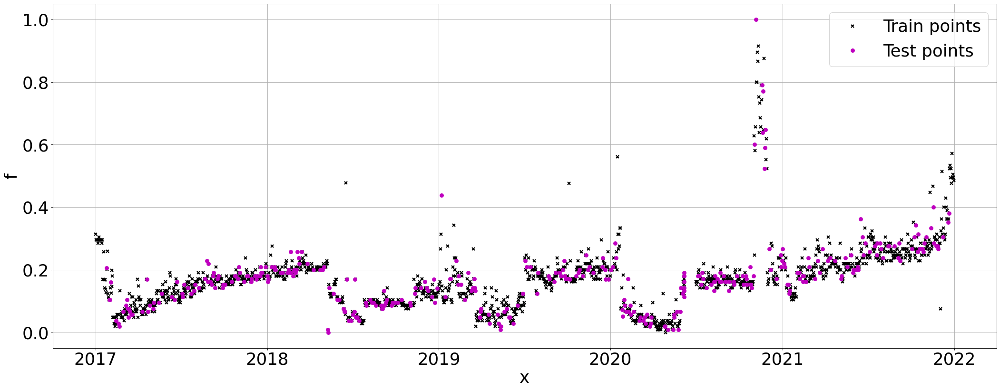

In [51]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI1.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI1['SO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [52]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [53]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [54]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [55]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.024221193672896508
MSE: 0.0015705495427748588
RMSE: 0.03963015950983365
MAPE: 2087243862596.3015
R2 Square 0.8721049563167239
__________________________________


In [56]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.9029832403579682

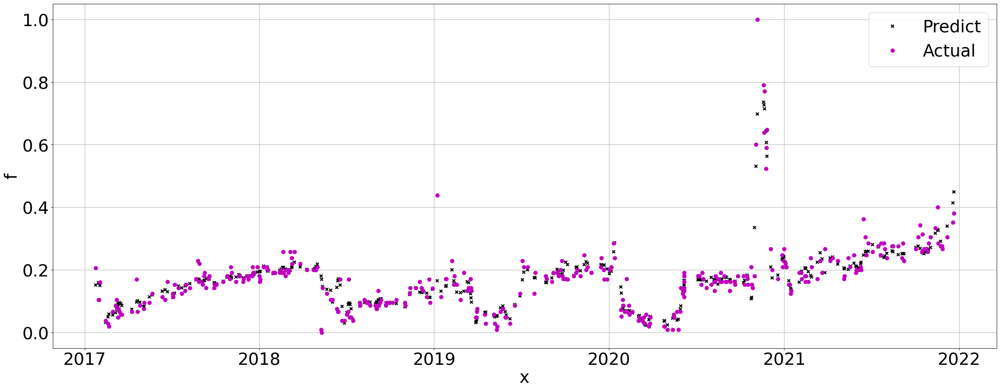

In [57]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [58]:
# Denormalisasi
max = 86.0
min = 4.0
test_Y_denorm = (test_Y.flatten() * (max - min) + min)
prediksi_denorm = (m1.predict(test_X)[0].flatten() * (max - min) + min)
metrics.r2_score(test_Y_denorm, prediksi_denorm)

0.8721049563167238

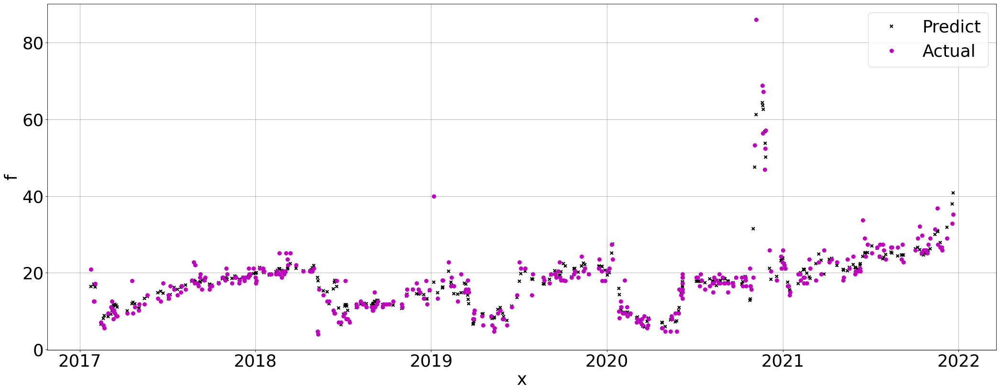

In [59]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), prediksi_denorm, 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y_denorm, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [60]:
data_test = pd.DataFrame(test_Y_denorm, columns=['Data Test'])
prediksi = pd.DataFrame(prediksi_denorm, columns=['Prediksi'])
selisih = abs(test_Y_denorm.flatten() - prediksi_denorm.flatten())
selisih = pd.DataFrame(selisih, columns=['Selisih'])
pd.concat([data_test, prediksi, selisih], axis=1, join='inner')

,Data Test,Prediksi,Selisih
0,18.838095,19.453284,0.615189
1,21.180952,18.550302,2.630650
2,18.838095,18.615358,0.222737
3,25.085714,21.021708,4.064006
4,9.935238,15.866067,5.930829
...,...,...,...
361,11.809524,11.734468,0.075056
362,19.619048,21.395721,1.776673
363,11.028571,11.455371,0.426800
364,20.400000,18.928668,1.471332


Periodic

In [61]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [62]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [63]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.026258538347558702
MSE: 0.002049823803022029
RMSE: 0.04527497987875897
MAPE: 2238667711619.6494
R2 Square 0.8330760681593455
__________________________________


In [64]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.8710983897635057

White

In [65]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [66]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [67]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.17091538117283292
MSE: 0.041492055060801676
RMSE: 0.20369598685492474
MAPE: 0.9972677595628415
R2 Square -2.3788352738840306
__________________________________


In [68]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-2.6595269601072875

Linear

In [69]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [70]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [71]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.07729027508375874
MSE: 0.01248812904752968
RMSE: 0.11175029775141399
MAPE: 968115709713.8625
R2 Square -0.01694965141583893
__________________________________


In [72]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

-0.08888136157902982

Exponential

In [73]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [74]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [75]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.023142820206743527
MSE: 0.001701332129082845
RMSE: 0.04124720753072679
MAPE: 2147308286675.338
R2 Square 0.8614548977650405
__________________________________


In [76]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.9999999999883109

Matern32

In [77]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [78]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [79]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.023519408665855616
MSE: 0.0015146529407222679
RMSE: 0.03891854237663928
MAPE: 2129397844712.097
R2 Square 0.8766568014935605
__________________________________


In [80]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.9153793686116124

Matern52

In [81]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [82]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [83]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.023756768206052967
MSE: 0.0015367158833492114
RMSE: 0.03920096788791332
MAPE: 2108628292930.434
R2 Square 0.8748601431047592
__________________________________


In [84]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.9084953211230308

Brownian

In [85]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [86]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [87]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.022917940908802337
MSE: 0.0014704876635594781
RMSE: 0.038346938124959574
MAPE: 2143269267054.7012
R2 Square 0.8802533260845895
__________________________________


In [88]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.942409822461735

Bias

In [89]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [90]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [91]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06961475102448494
MSE: 0.012280637697211287
RMSE: 0.11081803868148582
MAPE: 2093177835990.2568
R2 Square -5.294450522042027e-05
__________________________________


In [92]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-1.7654833861513453e-07

Periodik Eksponensial

In [93]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [94]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [95]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.17091538484743538
MSE: 0.04149205632835669
RMSE: 0.203695989966314
MAPE: 83007.61937161763
R2 Square -2.3788353771052275
__________________________________


In [96]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

-2.6595269136462125